In [1]:
import numpy as np
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import cv2
import glob
import argparse
import pickle
from PIL import Image
import os

In [2]:
from pipeline import callibrate_camera, get_perspective_transform_matrix, fit_polynomial, transform_image, \
    combined_gradient_color_threshold, combined_dir_color_threshold, dir_threshold, convert_to_grayscale, \
    sobel_mag_threshold, color_threshold, sobel_abs_threshold, search_around_poly, get_curvature, draw_lane

In [3]:
# Read mtx and dist from disk to avoid recomputation every time.
pickle_file_name = 'camera_cal.pkl'
with open(pickle_file_name, 'rb') as f:
    pickle_dict = pickle.load(f)
    mtx = pickle_dict['mtx']
    dist = pickle_dict['dist']

In [4]:
def undistort(img, mtx, dist):
    return cv2.undistort(img, mtx, dist, None, mtx)

def visualize_calibration(file_name, mtx=mtx, dist=dist):
    img = mpimg.imread(file_name)
    undist = undistort(img, mtx, dist)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    f.subplots_adjust(hspace = .2, wspace=.05)
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=30)
    ax2.imshow(undist)
    ax2.set_title('Undistorted Image', fontsize=30)

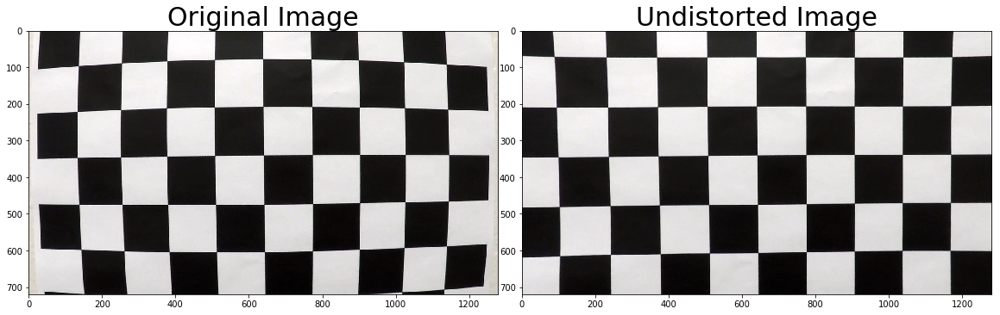

In [5]:
# Visualize calibrations on checker board.
visualize_calibration('./camera_cal/calibration1.jpg')

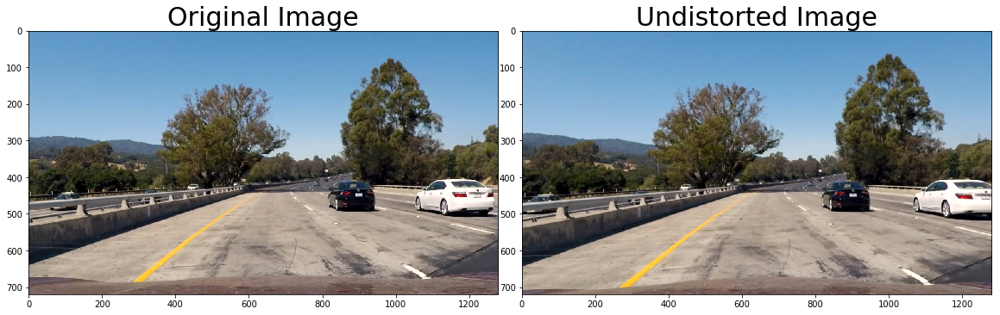

In [6]:
# Visualize calibrations on lanes.
visualize_calibration('./test_images/test1.jpg')

In [7]:
# Compute the perspective transform matrix.
#src=np.float32([
#    [576.04, 464.487], [707.079, 464.487],
#    [268.552, 675.317], [1034.03, 675.317]]
#)
#w = 1280
#margin = 200
#dst=np.float32([
#    [margin, 0],
#    [w - margin, 0],
#    [margin, 675.317],
#    [w - margin, 675.317],
#])
dst_points=np.float32([
        [200, 150],
        [1000, 150],
        [200, 700],
        [1000, 700],
    ])
perspective_transform_matrix, perspective_transform_matrix_inv = get_perspective_transform_matrix(mtx, dist, dst_points=dst_points)

In [8]:
def undistort_unwarp(file_name, mtx, dist, perspective_transform_matrix):
    img = mpimg.imread(file_name)
    undist = undistort(img, mtx, dist)
    height, width = undist.shape[:2]
    unwarp = cv2.warpPerspective(
        undist, perspective_transform_matrix, (width, height),
        flags=cv2.INTER_LINEAR
    )
    return undist, unwarp


def visualize_unwarp(undist, unwarp, src):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    f.subplots_adjust(hspace = .2, wspace=.05)
    ax1.imshow(undist)
    x = [src[0][0],src[2][0],src[3][0],src[1][0],src[0][0]]
    y = [src[0][1],src[2][1],src[3][1],src[1][1],src[0][1]]
    ax1.plot(x, y, color='#33cc99', alpha=0.4, linewidth=3, solid_capstyle='round', zorder=2)
    ax1.set_ylim([undist.shape[0],0])
    ax1.set_xlim([0,undist.shape[1]])
    ax1.set_title('Undistorted Image', fontsize=30)
    ax2.imshow(unwarp)
    ax2.set_title('Unwarped Image', fontsize=30)
    
    
def undist_unwarp_visualize(file_name, mtx, dist, perspective_transform_matrix, src):
    undist, unwarp = undistort_unwarp(file_name, mtx, dist, perspective_transform_matrix)
    visualize_unwarp(undist, unwarp, src)

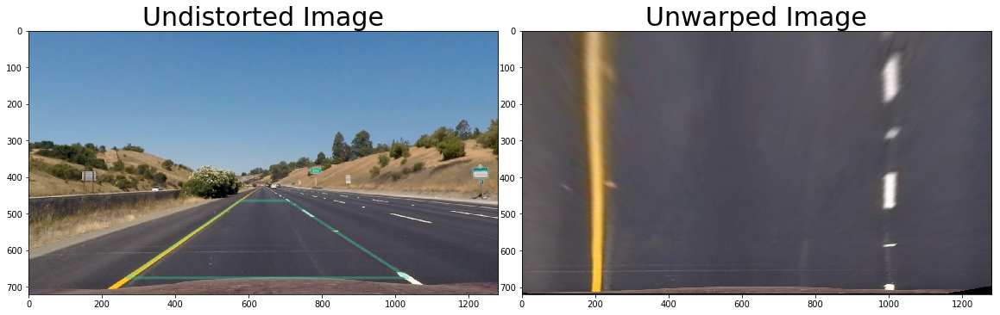

In [9]:
# Visualize unwarp
src=np.float32([
        [576.04, 464.487], [707.079, 464.487],
        [268.552, 675.317], [1034.03, 675.317]]
    )
undist_unwarp_visualize('./test_images/straight_lines1.jpg', mtx, dist, perspective_transform_matrix, src)

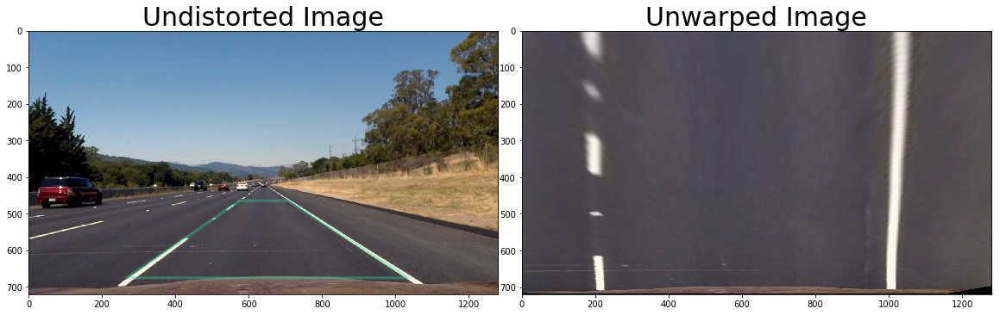

In [10]:
undist_unwarp_visualize('./test_images/straight_lines2.jpg', mtx, dist, perspective_transform_matrix, src)

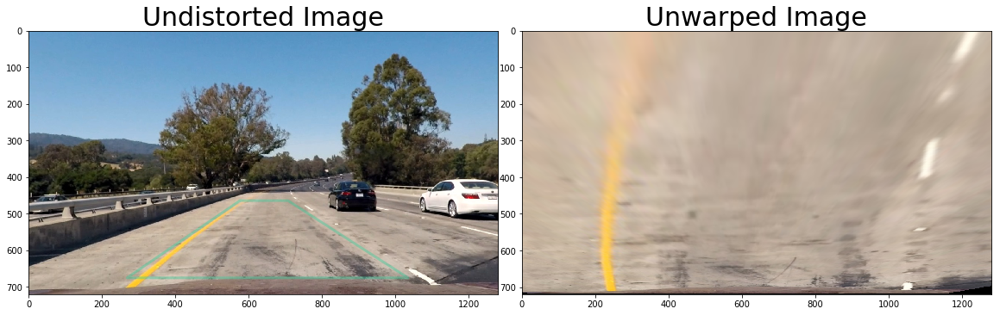

In [11]:
undist_unwarp_visualize('./test_images/test1.jpg', mtx, dist, perspective_transform_matrix, src)

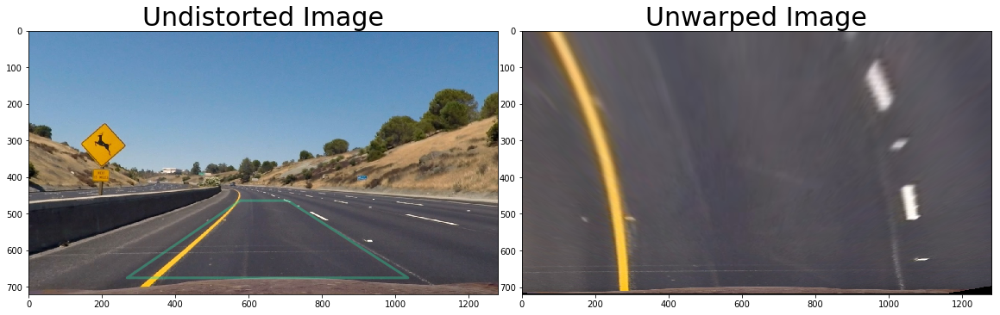

In [12]:
undist_unwarp_visualize('./test_images/test2.jpg', mtx, dist, perspective_transform_matrix, src)

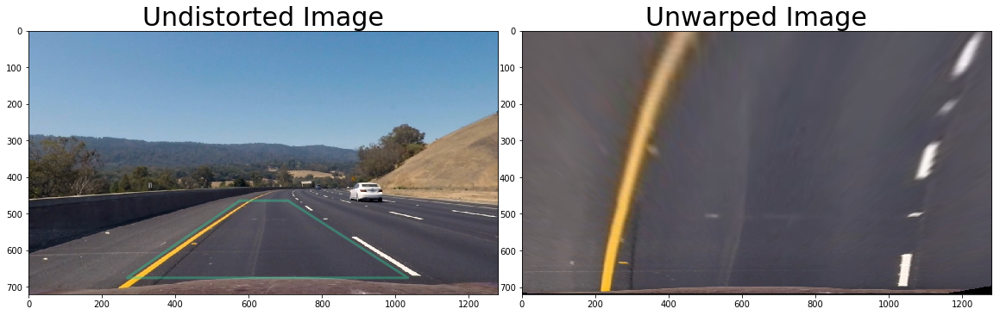

In [13]:
undist_unwarp_visualize('./test_images/test3.jpg', mtx, dist, perspective_transform_matrix, src)

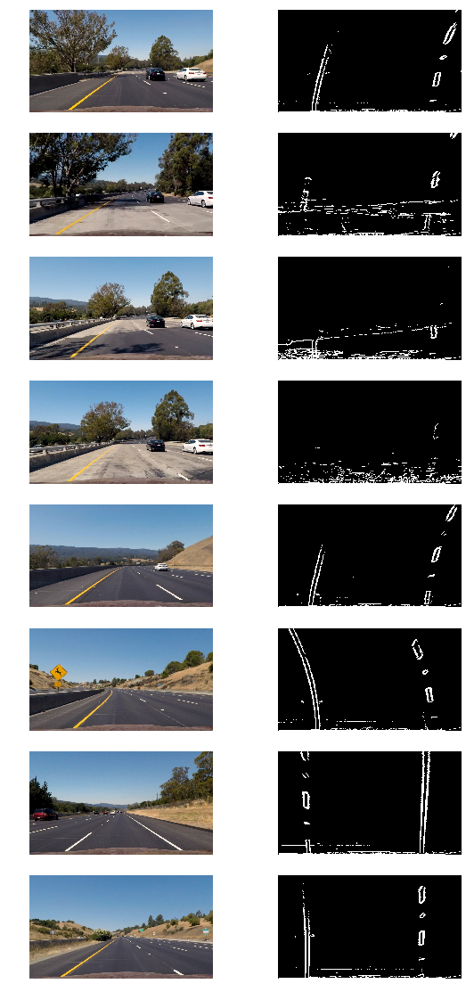

In [14]:
# Visualize magnitute threshold
images = glob.glob('./test_images/*.jpg')
                                          
# Set up plot
fig, axs = plt.subplots(len(images),2, figsize=(10, 20))
fig.subplots_adjust(hspace = .2, wspace=.001)
axs = axs.ravel()
                  
i = 0
for image in images:
    undist, unwarp = undistort_unwarp(image, mtx, dist, perspective_transform_matrix)
    thresholded = sobel_mag_threshold(unwarp, mag_thresh=(15, 255))
    axs[i].imshow(undist)
    axs[i].axis('off')
    i += 1
    axs[i].imshow(thresholded, cmap='gray')
    axs[i].axis('off')
    i += 1

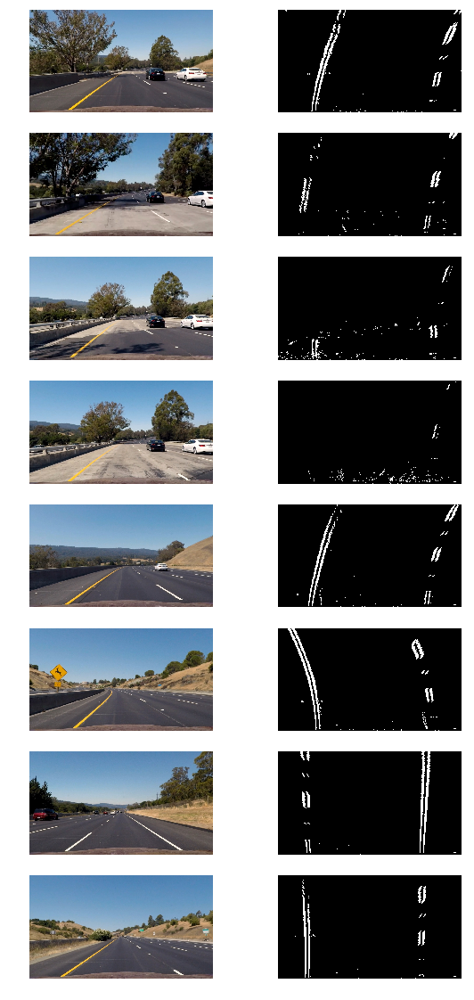

In [15]:
# Visualize abs x threshold
images = glob.glob('./test_images/*.jpg')
                                          
# Set up plot
fig, axs = plt.subplots(len(images),2, figsize=(10, 20))
fig.subplots_adjust(hspace = .2, wspace=.001)
axs = axs.ravel()
                  
i = 0
for image in images:
    undist, unwarp = undistort_unwarp(image, mtx, dist, perspective_transform_matrix)
    thresholded = sobel_abs_threshold(unwarp, thresh=(20, 255))
    axs[i].imshow(undist)
    axs[i].axis('off')
    i += 1
    axs[i].imshow(thresholded, cmap='gray')
    axs[i].axis('off')
    i += 1

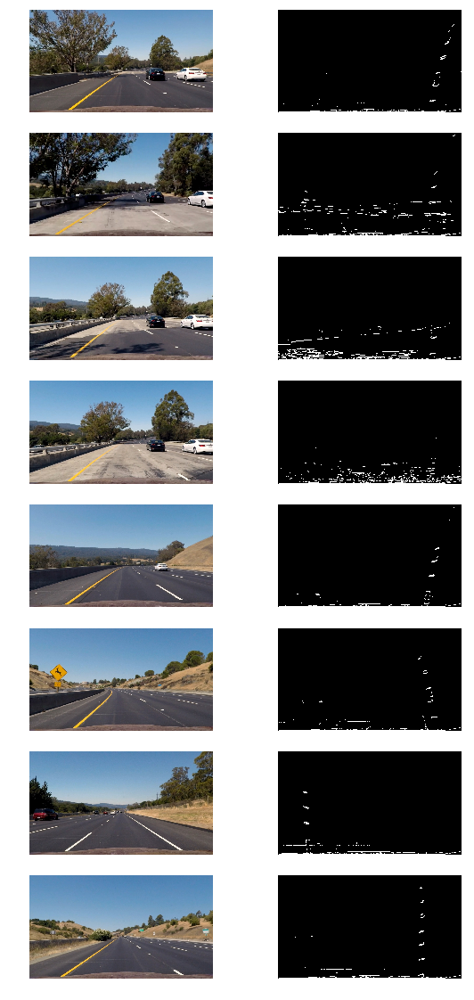

In [16]:
# Visualize abs 'y' threshold
images = glob.glob('./test_images/*.jpg')
                                          
# Set up plot
fig, axs = plt.subplots(len(images),2, figsize=(10, 20))
fig.subplots_adjust(hspace = .2, wspace=.001)
axs = axs.ravel()
                  
i = 0
for image in images:
    undist, unwarp = undistort_unwarp(image, mtx, dist, perspective_transform_matrix)
    thresholded = sobel_abs_threshold(unwarp, orient='y', thresh=(20, 255))
    axs[i].imshow(undist)
    axs[i].axis('off')
    i += 1
    axs[i].imshow(thresholded, cmap='gray')
    axs[i].axis('off')
    i += 1

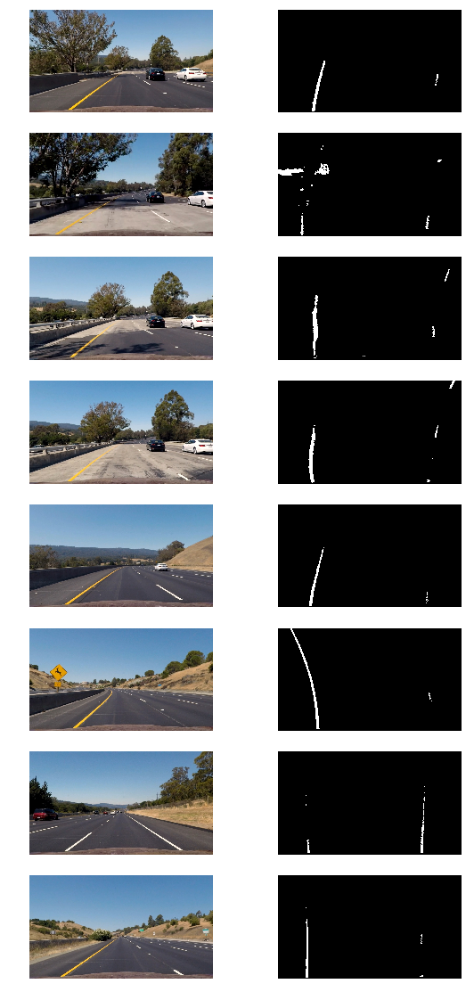

In [17]:
# Visualize color threshold
images = glob.glob('./test_images/*.jpg')
                                          
# Set up plot
fig, axs = plt.subplots(len(images),2, figsize=(10, 20))
fig.subplots_adjust(hspace = .2, wspace=.001)
axs = axs.ravel()
                  
i = 0
for image in images:
    undist, unwarp = undistort_unwarp(image, mtx, dist, perspective_transform_matrix)
    thresholded = color_threshold(unwarp, thresh=(190, 255))
    axs[i].imshow(undist)
    axs[i].axis('off')
    i += 1
    axs[i].imshow(thresholded, cmap='gray')
    axs[i].axis('off')
    i += 1

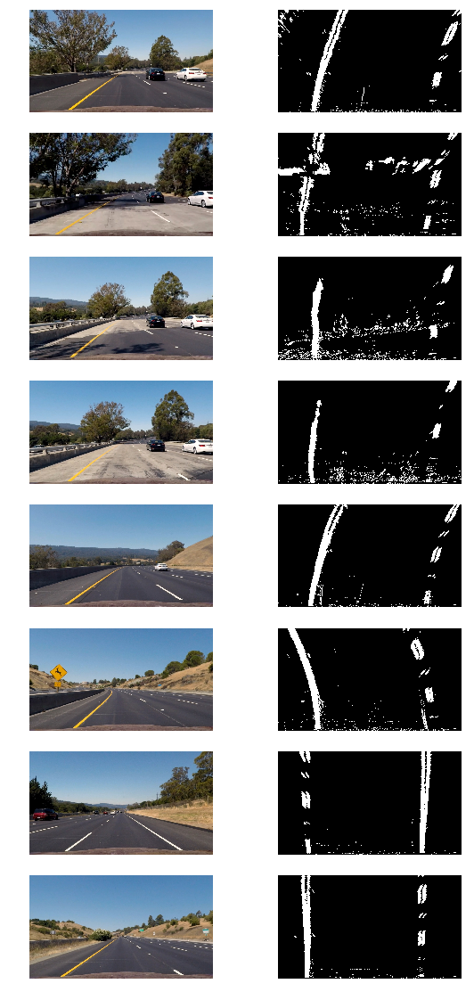

In [18]:
# Visualize combined_gradient_color_threshold
images = glob.glob('./test_images/*.jpg')
                                          
# Set up plot
fig, axs = plt.subplots(len(images),2, figsize=(10, 20))
fig.subplots_adjust(hspace = .2, wspace=.001)
axs = axs.ravel()
                  
i = 0
for image in images:
    undist, unwarp = undistort_unwarp(image, mtx, dist, perspective_transform_matrix)
    thresholded = combined_gradient_color_threshold(unwarp, color_thresh=(150, 255), grad_x_thresh=(10, 255))
    axs[i].imshow(undist)
    axs[i].axis('off')
    i += 1
    axs[i].imshow(thresholded, cmap='gray')
    axs[i].axis('off')
    i += 1



In [19]:
def dir_threshold2(img, sobel_kernel=11, thresh=( 0, np.pi/10)):
    # Grayscale
    gray = convert_to_grayscale(img)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction,
    # apply a threshold, and create a binary image result
    absgraddir = np.absolute(np.arctan2(np.absolute(sobely), np.absolute(sobelx)))
    binary_output = np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1
    # Return the binary image
    return binary_output

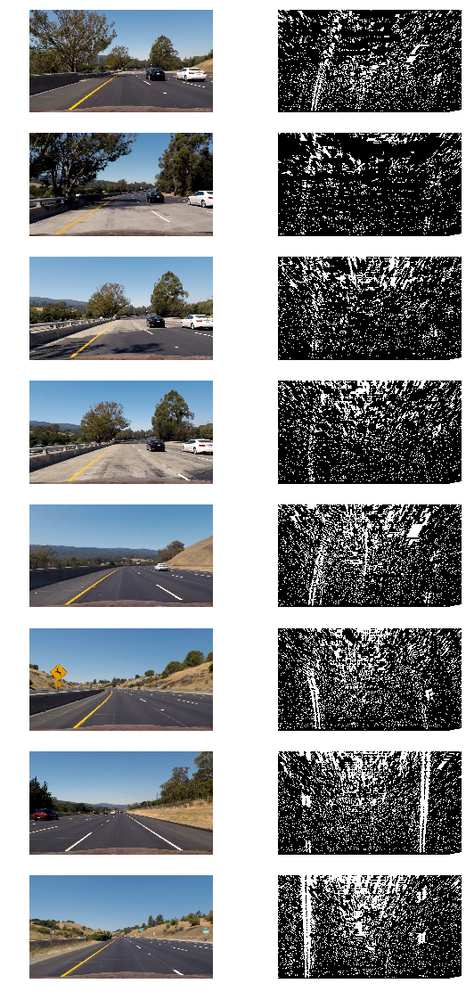

In [20]:
# Visualize direction threshold
images = glob.glob('./test_images/*.jpg')
                                          
# Set up plot
fig, axs = plt.subplots(len(images),2, figsize=(10, 20))
fig.subplots_adjust(hspace = .2, wspace=.001)
axs = axs.ravel()
                  
i = 0
for image in images:
    undist, unwarp = undistort_unwarp(image, mtx, dist, perspective_transform_matrix)
    thresholded = dir_threshold2(unwarp)
    axs[i].imshow(undist)
    axs[i].axis('off')
    i += 1
    axs[i].imshow(thresholded, cmap='gray')
    axs[i].axis('off')
    i += 1


In [21]:
def combined_grad_dir_color_threshold(
    img, grad_x_thresh=(25, 255), color_thresh=(120, 255), dir_thresh=(0, np.pi/40)
):
    threshold_grad = sobel_abs_threshold(img, thresh=grad_x_thresh)
    threshold_color = color_threshold(img, thresh=color_thresh)    
    threshold_dir = dir_threshold(img, thresh=dir_thresh)
    combined_binary = np.zeros_like(threshold_dir)
    combined_binary[((threshold_grad == 1) | (threshold_color == 1)) & (threshold_dir == 1)] = 1
    return combined_binary

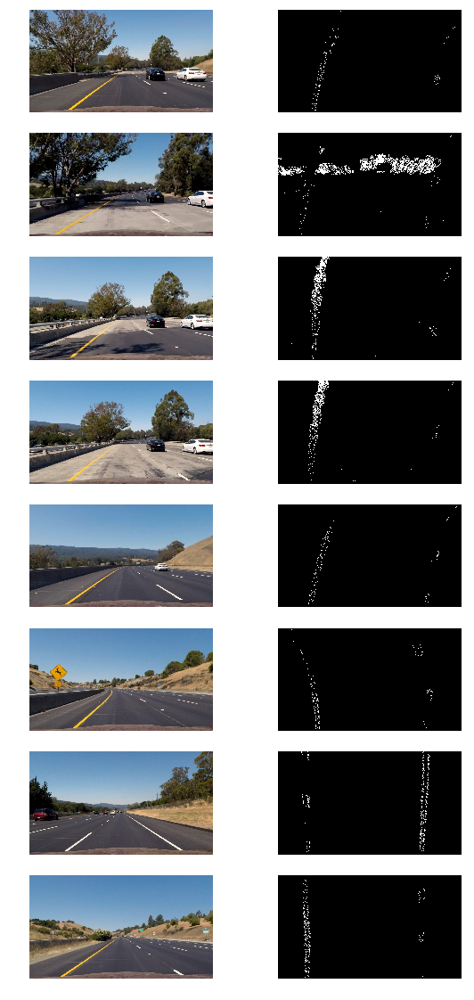

In [22]:
# Visualize combined_gradient_color_threshold
images = glob.glob('./test_images/*.jpg')
                                          
# Set up plot
fig, axs = plt.subplots(len(images),2, figsize=(10, 20))
fig.subplots_adjust(hspace = .2, wspace=.001)
axs = axs.ravel()
                  
i = 0
for image in images:
    undist, unwarp = undistort_unwarp(image, mtx, dist, perspective_transform_matrix)
    thresholded = combined_grad_dir_color_threshold(unwarp)
    axs[i].imshow(undist)
    axs[i].axis('off')
    i += 1
    axs[i].imshow(thresholded, cmap='gray')
    axs[i].axis('off')
    i += 1


In [23]:
from ipywidgets import interact, interactive, fixed


In [24]:
undist, unwarp = undistort_unwarp('test_images/straight_lines1.jpg', mtx, dist, perspective_transform_matrix)
def update(kernel_size, min_thresh, max_thresh):
    dir_threshold_img = dir_threshold2(unwarp, kernel_size, (min_thresh, max_thresh))
    # Visualize sobel direction threshold
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    f.subplots_adjust(hspace = .2, wspace=.05)
    ax1.imshow(unwarp)
    ax1.set_title('Unwarped Image', fontsize=30)
    ax2.imshow(dir_threshold_img, cmap='gray')
    ax2.set_title('Sobel Direction', fontsize=30)

interact(update, kernel_size=(1,31,2), 
                 min_thresh=(0,np.pi/10,0.01), 
                 max_thresh=(0,np.pi/10,0.01))


interactive(children=(IntSlider(value=15, description='kernel_size', max=31, min=1, step=2), FloatSlider(value…

<function __main__.update(kernel_size, min_thresh, max_thresh)>

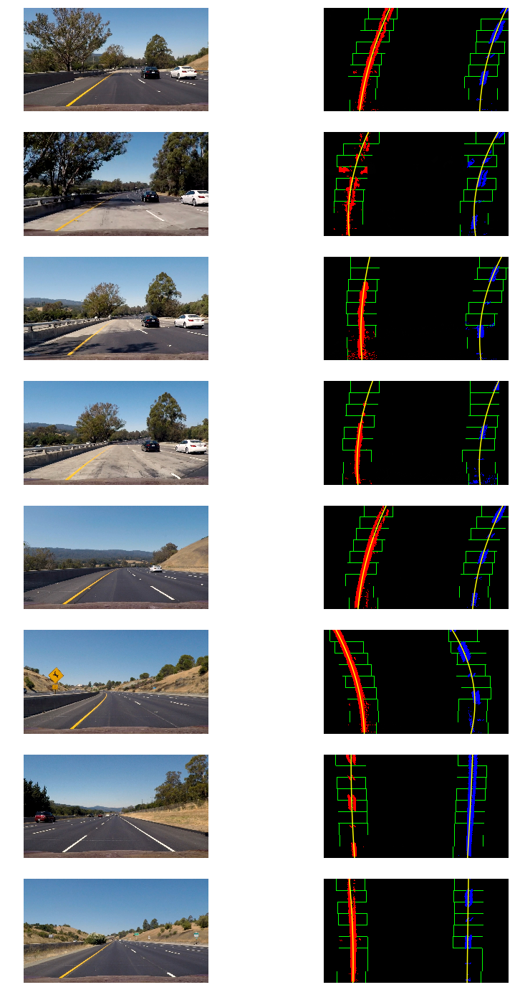

In [25]:
images = glob.glob('./test_images/*.jpg')
                                          
# Set up plot
fig, axs = plt.subplots(len(images),2, figsize=(15, 25))
fig.subplots_adjust(hspace = .2, wspace=.001)
axs = axs.ravel()
                  
i = 0

for image_file in images:
    img = mpimg.imread(image_file)
    undist, threshold_binary, p_transformed, out_img, left_fitx, right_fitx, left_fit, right_fit = transform_image(
        img, mtx=mtx, dist=dist,
        p_transform_matrix=perspective_transform_matrix,
        color_threshold=(155, 255), grad_x_thresh=(15, 255)
    )
    axs[i].imshow(img)
    axs[i].axis('off')
    i += 1
    ploty = np.linspace(0, out_img.shape[0]-1, out_img.shape[0] )
    axs[i].imshow(out_img, cmap='gray')
    axs[i].plot(left_fitx, ploty, color='yellow')
    axs[i].plot(right_fitx, ploty, color='yellow')
    axs[i].axis('off')
    i += 1



In [26]:
# In the images provided test6 and test4 seem to be similar with test4 being after test6.
img = mpimg.imread('test_images/test6.jpg')
undist, threshold_binary, p_transformed, out_img, left_fitx, right_fitx, left_fit, right_fit = transform_image(
    img, mtx=mtx, dist=dist,
    p_transform_matrix=perspective_transform_matrix,
    color_threshold=(155, 255), grad_x_thresh=(15, 255)
)
ploty = np.linspace(0, img.shape[0]-1, img.shape[0] )
left_fit = np.polyfit(ploty, left_fitx, 2)
right_fit = np.polyfit(ploty, right_fitx, 2)

Text(0.5,1,'Unwarped Image')

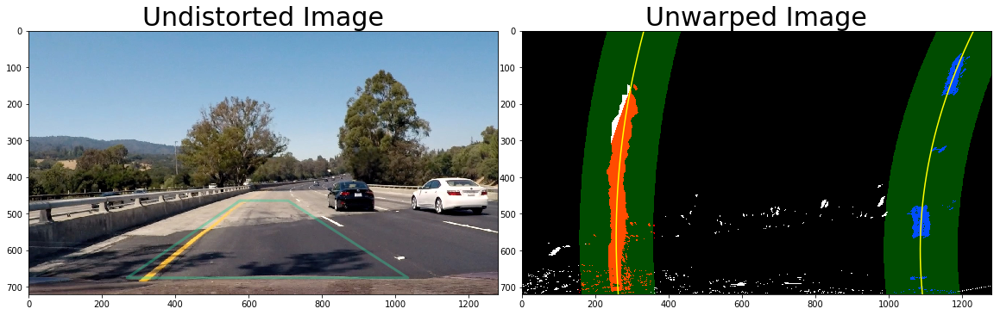

In [27]:
img2 = mpimg.imread('test_images/test4.jpg')
undist2 = cv2.undistort(img2, mtx, dist, None, mtx)
height, width = img2.shape[:2]
p_transformed2 = cv2.warpPerspective(
    undist2, perspective_transform_matrix, (width, height),
    flags=cv2.INTER_LINEAR
)
threshold_binary2 = combined_gradient_color_threshold(
        p_transformed2, grad_x_thresh=(20, 255), color_thresh=(150, 255)
)
# left_fitx, right_fitx - Fitted point corresponding to ploty.
# left_fit, right_fit - Polynomial firt for left and right lane.
# leftx, lefty, rightx, righty - Actual points in the image in the region around the polynomial which
# were non zero.
result, left_fitx, right_fitx, left_fit, right_fit, leftx, lefty, rightx, righty = search_around_poly(threshold_binary2, left_fit, right_fit)
#plt.imshow(result)
#plt.show()
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
f.subplots_adjust(hspace = .2, wspace=.05)
ax1.imshow(img2)
x = [src[0][0],src[2][0],src[3][0],src[1][0],src[0][0]]
y = [src[0][1],src[2][1],src[3][1],src[1][1],src[0][1]]
ax1.plot(x, y, color='#33cc99', alpha=0.4, linewidth=3, solid_capstyle='round', zorder=2)
ax1.set_ylim([img2.shape[0],0])
ax1.set_xlim([0,img2.shape[1]])
ax1.set_title('Undistorted Image', fontsize=30)
ax2.imshow(result)
ax2.plot(left_fitx, ploty, color='yellow')
ax2.plot(right_fitx, ploty, color='yellow')
ax2.set_title('Unwarped Image', fontsize=30)

In [28]:
# Compute curvature.
def get_curvature_m(left_fitx, right_fitx, ploty, xm_per_pix=3.7/700, ym_per_pix=30/720):
    left_fit_m = np.polyfit(ploty * ym_per_pix, left_fitx * xm_per_pix, 2)
    right_fit_m = np.polyfit(ploty * ym_per_pix, right_fitx * xm_per_pix, 2)
    y_eval = np.max(ploty)
    left_curvature = get_curvature(left_fit_m, y_eval * ym_per_pix)
    right_curvature = get_curvature(right_fit_m, y_eval * ym_per_pix)
    return left_curvature, right_curvature
    
    

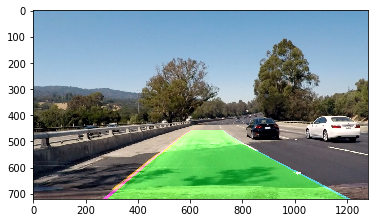

In [29]:
img2_out = draw_lane(img2, threshold_binary2, left_fit, right_fit, perspective_transform_matrix_inv)
plt.imshow(img2_out)

In [30]:
#ploty = np.linspace(0, img2_out.shape[0]-1, img2_out.shape[0] )
print(get_curvature_m(left_fitx, right_fitx, ploty))

(2882.134345681808, 5423.514272211621)


In [31]:
img2 = mpimg.imread('test_images/test2.jpg')
undist, threshold_binary, p_transformed, out_img, left_fitx, right_fitx, left_fit, right_fit = transform_image(
    img2, mtx=mtx, dist=dist,
    p_transform_matrix=perspective_transform_matrix,
    color_threshold=(155, 255), grad_x_thresh=(15, 255)
)
ploty = np.linspace(0, img.shape[0]-1, img.shape[0] )
left_fit = np.polyfit(ploty, left_fitx, 2)
right_fit = np.polyfit(ploty, right_fitx, 2)

In [32]:
print(get_curvature_m(left_fitx, right_fitx, ploty))

(4344.860811745811, 10495.729442251723)


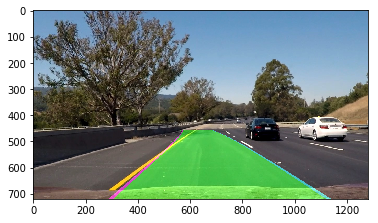

In [33]:
img2_out = draw_lane(img, threshold_binary, left_fit, right_fit, perspective_transform_matrix_inv)
plt.imshow(img2_out)

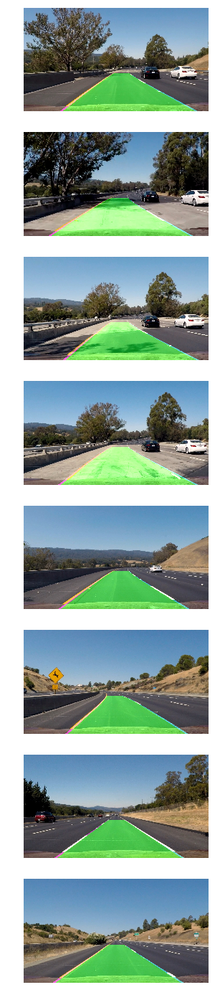

In [34]:
fig, axs = plt.subplots(len(images), 1, figsize=(15, 25))
fig.subplots_adjust(hspace = .2, wspace=.001)
axs = axs.ravel()
                  
i = 0
for image_file in images:
    img = mpimg.imread(image_file)
    undist, threshold_binary, p_transformed, out_img, left_fitx, right_fitx, left_fit, right_fit = transform_image(
        img, mtx=mtx, dist=dist,
        p_transform_matrix=perspective_transform_matrix,
        color_threshold=(155, 255), grad_x_thresh=(15, 255)
    )
    ploty = np.linspace(0, img.shape[0]-1, img.shape[0] )
    left_fit = np.polyfit(ploty, left_fitx, 2)
    right_fit = np.polyfit(ploty, right_fitx, 2)
    img_lane_out = draw_lane(img, threshold_binary, left_fit, right_fit, perspective_transform_matrix_inv)
    axs[i].imshow(img_lane_out)
    axs[i].axis('off')
    i += 1


In [35]:
def diff_fraction(c, p):
    return abs(c - p)/c


def evaluate_poly(fit, p):
    return fit[0] * (p ** 2) + fit[1] * p + fit[2]

def has_enough_points(binary_warped, left_fit_prev, right_fit_prev, margin):
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    MIN_POINTS_FIT = 5
    
    left_lane_inds = ((nonzerox > (left_fit[0] * (nonzeroy ** 2) + left_fit[1] * nonzeroy +
                    left_fit[2] - margin)) & (nonzerox < (left_fit[0] * (nonzeroy ** 2) +
                    left_fit[1]*nonzeroy + left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0] * (nonzeroy ** 2) + right_fit[1] * nonzeroy +
                    right_fit[2] - margin)) & (nonzerox < (right_fit[0] * (nonzeroy ** 2) +
                    right_fit[1] * nonzeroy + right_fit[2] + margin)))
    
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds]
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    return len(leftx) >= MIN_POINTS_FIT and len(lefty) >= MIN_POINTS_FIT and len(rightx) >= MIN_POINTS_FIT and len(righty) >= MIN_POINTS_FIT

    
def sanity_check(binary_warped, left_fit, right_fit, left_fit_prev, right_fit_prev, image_shape):
    """
    Returns true if left_fit and right_fit pass sanity checks.
    
    :param left_fit - Left fit polynomial.
    :param right_fit - Right fit polynomial.
    :param left_fit_prev - Previous left fit polynomial.
    :param right_fit_prev - Previous right fit polynomial.
    :param margin - Margin used.
    """
    WIDTH_DIFF_THRESHOLD = 0.2
    EXPECTED_WIDTH = 800
    EXPECTED_WIDTH_THRESHOLD = 0.05        
    COEFFICIENT_DIFF_THRESHOLD = 0.2
    MIN_POINTS_FIT = 5
        
    width_lowest = evaluate_poly(right_fit, image_shape[0]) - evaluate_poly(left_fit, image_shape[0])
    width_mid = evaluate_poly(right_fit, image_shape[0]//2) - evaluate_poly(left_fit, image_shape[0]//2)
    width_highest = evaluate_poly(right_fit, 0) - evaluate_poly(left_fit, 0)
    
    # Check that the width makes sense. 
    min_width = min([width_lowest, width_mid, width_highest])
    max_width = max([width_lowest, width_mid, width_highest])
    if diff_fraction(min_width, EXPECTED_WIDTH) > EXPECTED_WIDTH_THRESHOLD or \
        diff_fraction(max_width, EXPECTED_WIDTH) > EXPECTED_WIDTH_THRESHOLD:
        return False
    
    # Check that the left_fit and right_fit differ by similar number of pixels at the bottom
    # mid and top. This is a test of lanes being almost parallel.
    if diff_fraction(width_lowest, width_highest) > WIDTH_DIFF_THRESHOLD or \
        diff_fraction(width_lowest, width_mid) > WIDTH_DIFF_THRESHOLD:
        return False
    
        
    # Check if the current fit differs significantly from the previous
    if diff_fraction(left_fit[0], left_fit_prev[0]) > COEFFICIENT_DIFF_THRESHOLD or \
        diff_fraction(left_fit[1], left_fit_prev[1]) > COEFFICIENT_DIFF_THRESHOLD or \
        diff_fraction(left_fit[2], left_fit_prev[2]) > COEFFICIENT_DIFF_THRESHOLD or \
        diff_fraction(right_fit[0], right_fit_prev[0]) > COEFFICIENT_DIFF_THRESHOLD or \
        diff_fraction(right_fit[1], right_fit_prev[1]) > COEFFICIENT_DIFF_THRESHOLD or \
        diff_fraction(right_fit[2], right_fit_prev[2]) > COEFFICIENT_DIFF_THRESHOLD:
            return False

    return True

In [36]:
from collections import deque

class Line():
    def __init__(self, last_n=5):
        self.last_n = last_n
        # was the line detected in the last iteration?
        self.detected = False
        # x values of the last n fits of the line
        self.recent_xfitted = deque(maxlen=last_n) 
        # polynomial coefficients for the most recent fit
        self.current_fit = None 
        # radius of curvature of the line in some units
        self.radius_of_curvature = None 
        # distance in meters of vehicle center from the line
        self.line_base_pos = None
        
    
    def add(self, fit, radius_of_curvature):
        self.radius_of_curvature = radius_of_curvature
        self.recent_xfitted.append(fit)
        
    def has_enough_points(self):
        return len(self.recent_xfitted) == self.last_n
    
    # Use clear when we encounter a frame which is not well predicted by previous frames.
    def clear(self):
        self.recent_xfitted.clear()
        
    # Only use when has_enough_points returns true otherwise returns None.
    def get_smooth_fit(self):
        if not self.has_enough_points():
            return None
        return np.average(np.array(list(self.recent_xfitted)), axis=0)
        

In [37]:
# For sanity checking, generate an image using the sliding window method on every frame.

In [38]:
left_line = Line()
right_line = Line()
def process_image(img):
    undist, threshold_binary, p_transformed, out_img, left_fitx, right_fitx, left_fit, right_fit = transform_image(
        img, mtx=mtx, dist=dist,
        p_transform_matrix=perspective_transform_matrix,
        color_threshold=(155, 255), grad_x_thresh=(15, 255)
    )
    ploty = np.linspace(0, img.shape[0]-1, img.shape[0] )
    left_fit = np.polyfit(ploty, left_fitx, 2)
    right_fit = np.polyfit(ploty, right_fitx, 2)
    img_lane_out = draw_lane(img, threshold_binary, left_fit, right_fit, perspective_transform_matrix_inv)
    return img_lane_out

In [41]:
from moviepy.editor import VideoFileClip

video_output1 = 'project_video_output.mp4'
video_input1 = VideoFileClip('project_video.mp4')#.subclip(22,26)
processed_video = video_input1.fl_image(process_image)
%time processed_video.write_videofile(video_output1, audio=False)

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


100%|█████████▉| 1260/1261 [01:34<00:00, 13.27it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

CPU times: user 5min 58s, sys: 37.8 s, total: 6min 35s
Wall time: 1min 35s


In [2]:
# Now optimize the video generation so that sliding window is needed only when
# searching around a margin of the current best frame fails.

In [39]:
def try_margin(left_line, right_line):
    return left_line.has_enough_points() and right_line.has_enough_points()

In [40]:
left_line = Line()
right_line = Line()
total_frames = 0
total_try_margin = 0
total_is_sane = 0
color_threshold=(155, 255)
grad_x_thresh=(15, 255)
margin = 100

In [41]:
def process_image_optimized(img):
    height, width = img.shape[:2]    
    optimize = False
    if try_margin(left_line, right_line):
        undist = cv2.undistort(img, mtx, dist, None, mtx)
        p_transformed = cv2.warpPerspective(
            undist, perspective_transform_matrix, (width, height),
            flags=cv2.INTER_LINEAR
        )
        threshold_binary = combined_gradient_color_threshold(
            p_transformed, grad_x_thresh, color_threshold
        )
        # Try to search in the vicinity of the current best fits.
        left_fit_prev = left_line.get_smooth_fit()
        right_fit_prev = right_line.get_smooth_fit()
        is_sane = False
        if has_enough_points(threshold_binary, left_fit_prev, right_fit_prev, margin):
            result, left_fit_x, right_fit_x, left_fit, right_fit, leftx, lefty, rightx, righty = search_around_poly(
                threshold_binary, left_fit_prev, right_fit_prev
            )
            is_sane = sanity_check(threshold_binary, left_fit, right_fit, left_fit_prev, right_fit_prev, img.shape)        
        
        if is_sane:
            optimize = True
        else:
            left_line.clear()
            right_line.clear()
    
    if not optimize:
        undist, threshold_binary, p_transformed, out_img, left_fitx, right_fitx, left_fit, right_fit = transform_image(
            img, mtx=mtx, dist=dist,
            p_transform_matrix=perspective_transform_matrix,
            color_threshold=(155, 255), grad_x_thresh=(15, 255)
        )
    
    left_line.add(left_fit, 0)
    right_line.add(right_fit, 0)
    ploty = np.linspace(0, img.shape[0]-1, img.shape[0] )
    img_lane_out = draw_lane(img, threshold_binary, left_fit, right_fit, perspective_transform_matrix_inv)
    return img_lane_out

In [42]:
from moviepy.editor import VideoFileClip

video_output1 = 'project_video_output_opt.mp4'
video_input1 = VideoFileClip('project_video.mp4')
processed_video = video_input1.fl_image(process_image_optimized)
%time processed_video.write_videofile(video_output1, audio=False)

[MoviePy] >>>> Building video project_video_output_opt.mp4
[MoviePy] Writing video project_video_output_opt.mp4


100%|█████████▉| 1260/1261 [01:45<00:00, 11.96it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output_opt.mp4 

CPU times: user 6min 35s, sys: 42.5 s, total: 7min 17s
Wall time: 1min 46s
